## 1 - Importation du corpus

In [228]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

In [229]:
df = pd.read_csv('dataset.csv')

## 2 - Information sur les données

In [230]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Resume    962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


<AxesSubplot:>

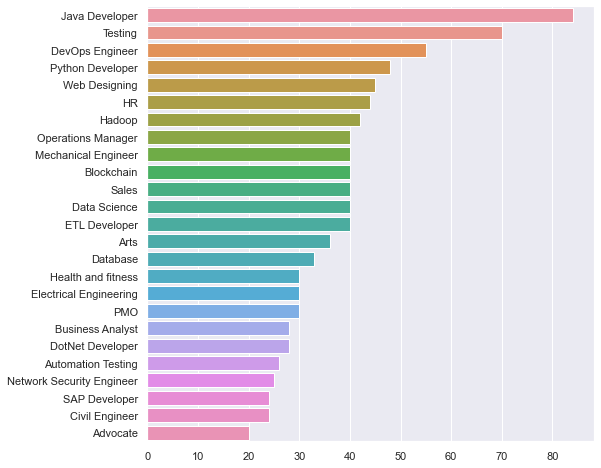

In [277]:
sns.set(rc={'figure.figsize':(8, 8)})
sns.barplot(df['Category'].value_counts().values, df['Category'].value_counts().index)

In [273]:
def split_words(text, words):
    text = text.split(' ')
    for word in text:
        words.append(word)

def get_word_cloud(df):
    words = []
    df['Resume'].apply(lambda x: split_words(x, words))
    words = (" ").join(words)

    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black',
                stopwords=set(STOPWORDS), 
                min_font_size = 10, max_words=50).generate(words)

    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

Word Cloud de la catégorie Data Science


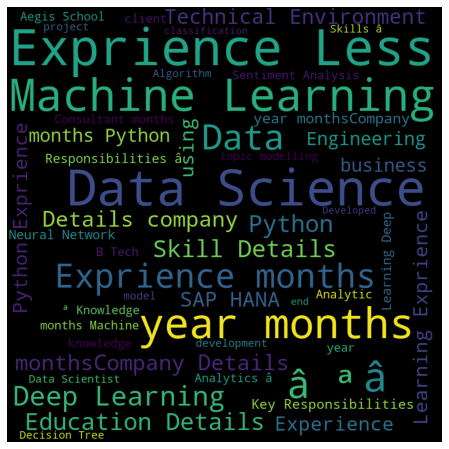

Word Cloud de la catégorie HR


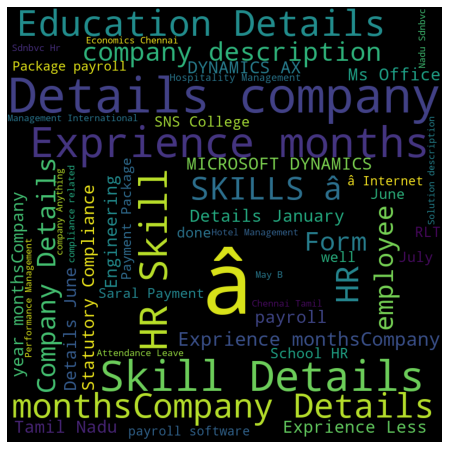

Word Cloud de la catégorie Advocate


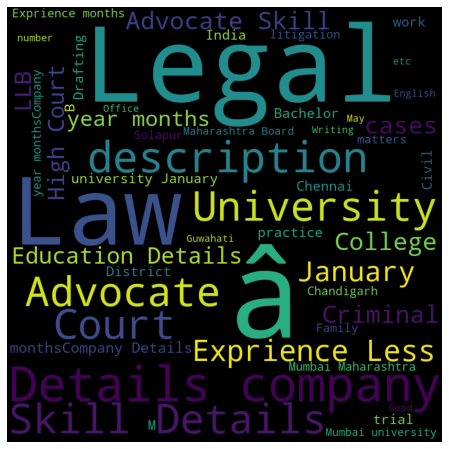

Word Cloud de la catégorie Arts


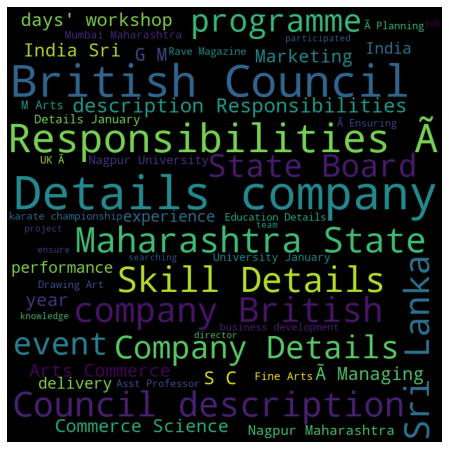

Word Cloud de la catégorie Web Designing


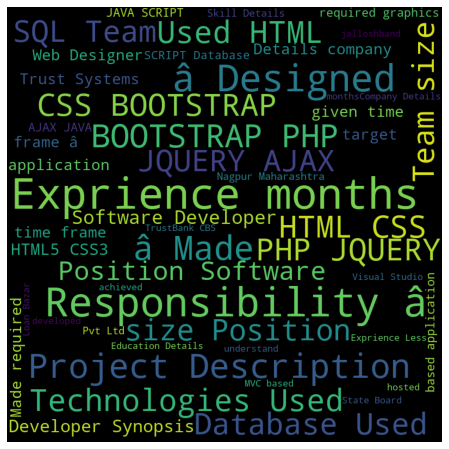

Word Cloud de la catégorie Mechanical Engineer


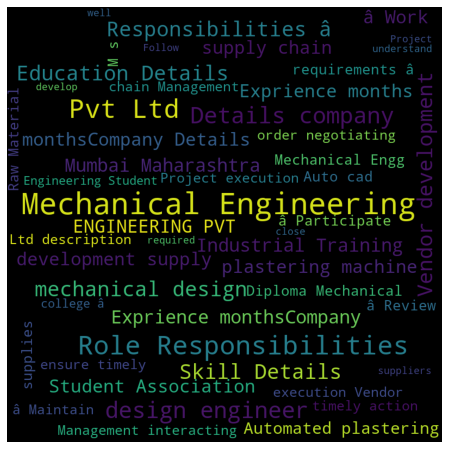

Word Cloud de la catégorie Sales


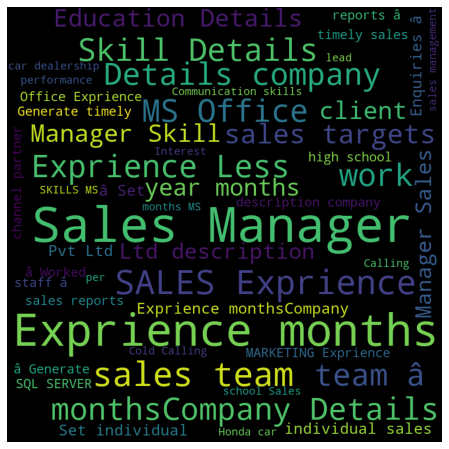

Word Cloud de la catégorie Health and fitness


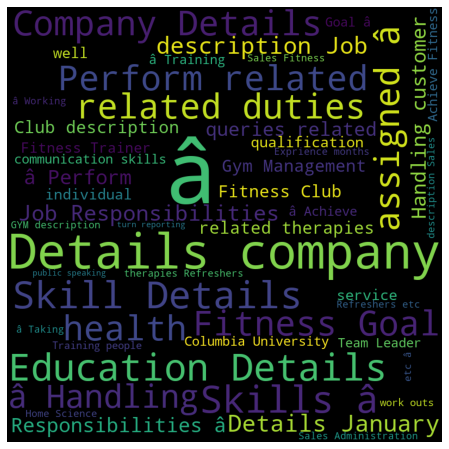

Word Cloud de la catégorie Civil Engineer


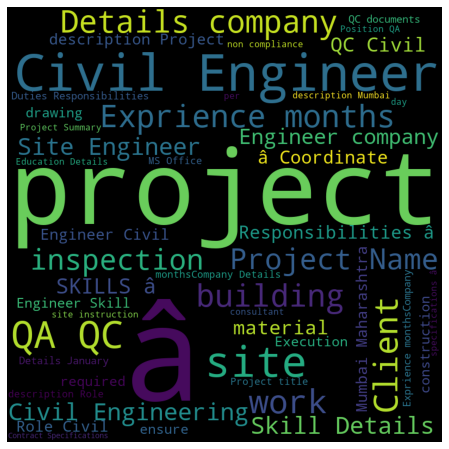

Word Cloud de la catégorie Java Developer


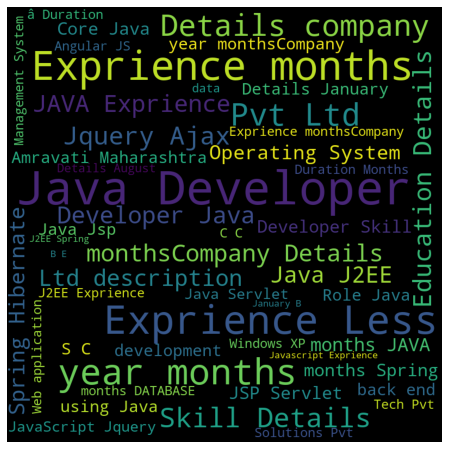

Word Cloud de la catégorie Business Analyst


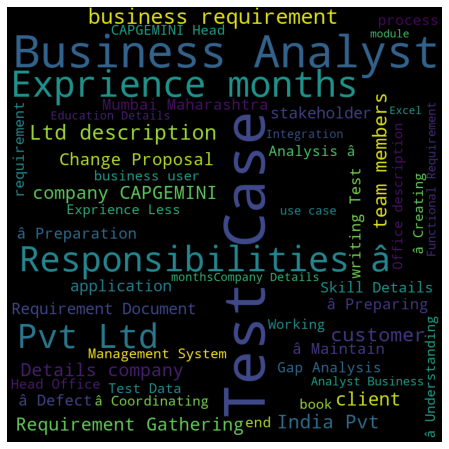

Word Cloud de la catégorie SAP Developer


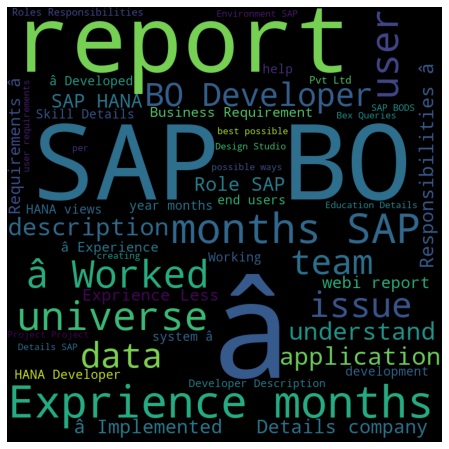

Word Cloud de la catégorie Automation Testing


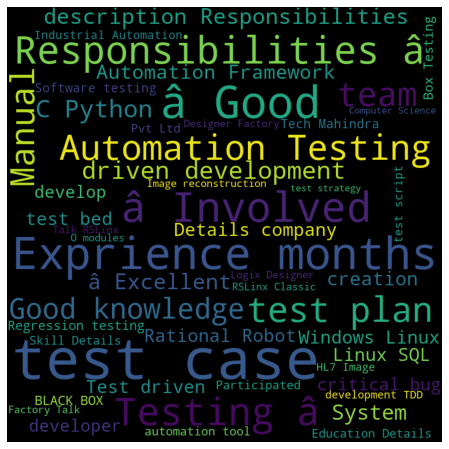

Word Cloud de la catégorie Electrical Engineering


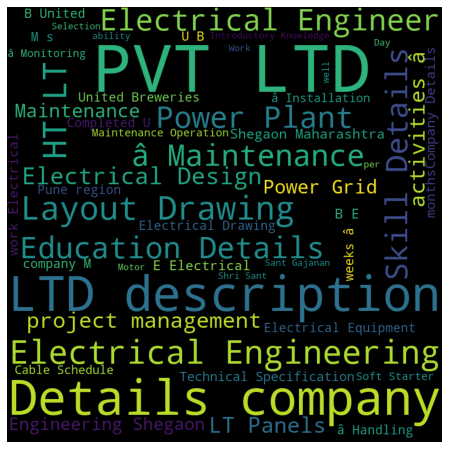

Word Cloud de la catégorie Operations Manager


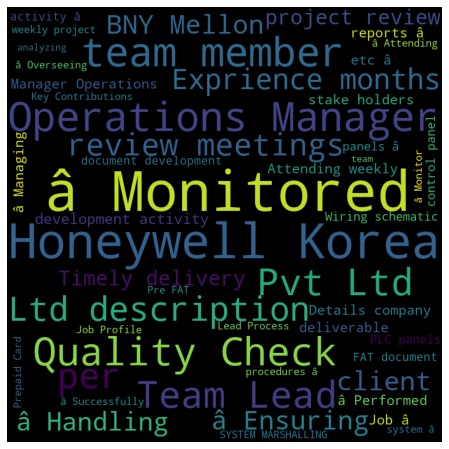

Word Cloud de la catégorie Python Developer


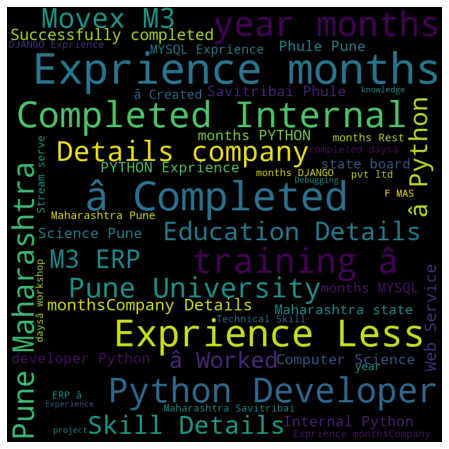

Word Cloud de la catégorie DevOps Engineer


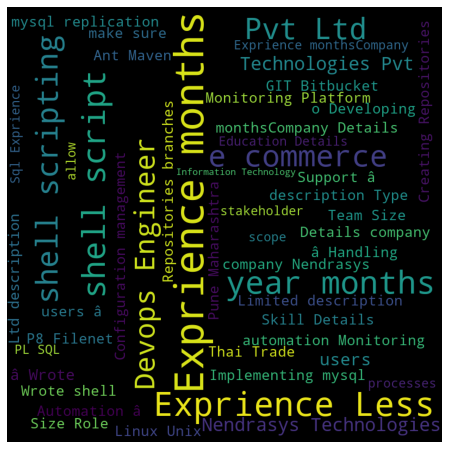

Word Cloud de la catégorie Network Security Engineer


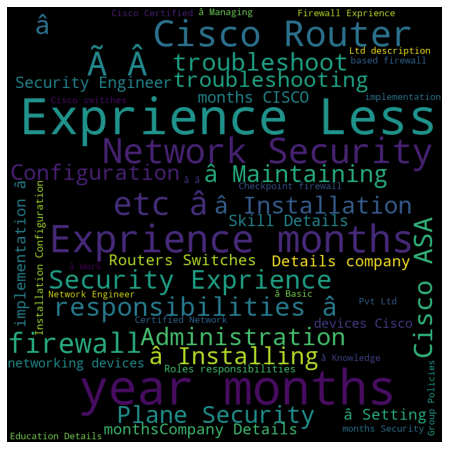

Word Cloud de la catégorie PMO


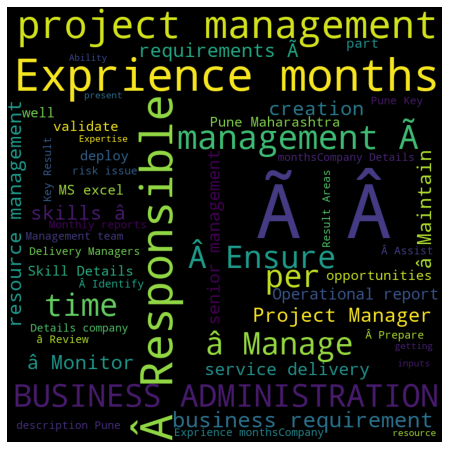

Word Cloud de la catégorie Database


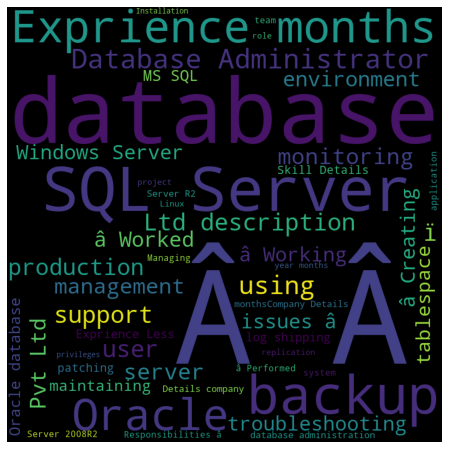

Word Cloud de la catégorie Hadoop


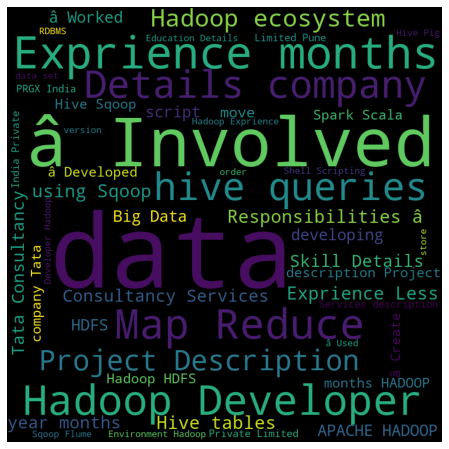

Word Cloud de la catégorie ETL Developer


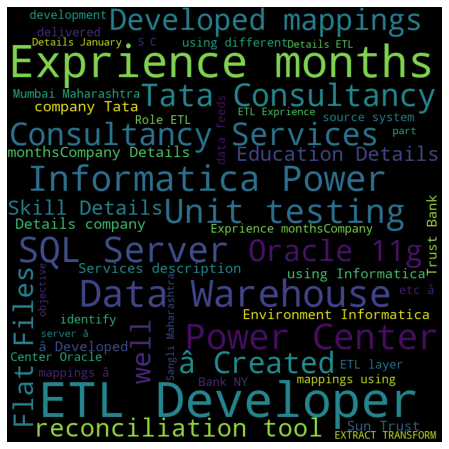

Word Cloud de la catégorie DotNet Developer


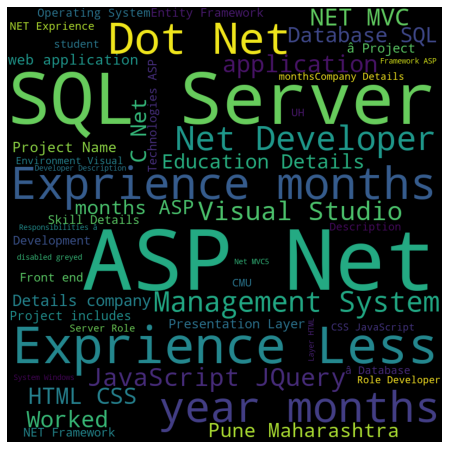

Word Cloud de la catégorie Blockchain


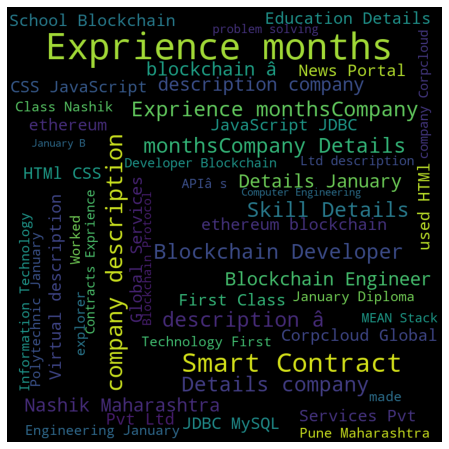

Word Cloud de la catégorie Testing


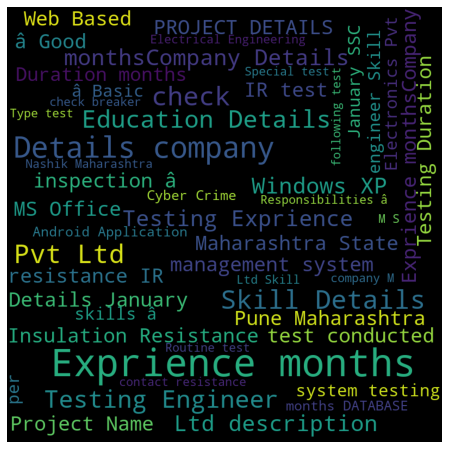

In [274]:
for column in df['Category'].unique():
    print("Word Cloud de la catégorie", column)
    get_word_cloud(df[df['Category'] == column])

## 3 - Séparation en corpus d’apprentissage et de test

In [233]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [234]:
le = LabelEncoder()
df['Category_encoded'] = le.fit_transform(df['Category'])

In [235]:
X = df['Resume'].values
y = df['Category_encoded'].values

In [236]:
X_train_orig, X_test_orig, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## 4 - Construction de la matrice documents termes pour l’apprentissage

In [237]:
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, STOPWORDS
import re

In [238]:
cv = CountVectorizer(stop_words='english', min_df=10, lowercase=True, strip_accents='ascii')

In [239]:
X_train_orig = clean_str(X_train_orig)

In [240]:
X_train = cv.fit_transform(X_train_orig) 

In [241]:
cv.get_feature_names()[:10]

['ab',
 'abilities',
 'ability',
 'able',
 'academic',
 'academy',
 'academydescription',
 'acb',
 'accenture',
 'accept']

In [242]:
len(cv.get_feature_names())

2658

In [243]:
X_train = X_train.toarray()

In [244]:
freq = np.sum(X_train, axis=0)

In [245]:
dico = {word: freq[i] for i, word in enumerate(cv.get_feature_names())}

In [246]:
dict(sorted(dico.items(), key=lambda item:item[1], reverse=True)[:10])

{'exprience': 3134,
 'details': 2439,
 'project': 2143,
 'data': 1682,
 'company': 1535,
 'management': 1379,
 'team': 1208,
 'maharashtra': 1171,
 'year': 1094,
 'testing': 904}

In [247]:
X_train.shape

(769, 2658)

## 5 - Modélisation à l’aide de la régression logistique

In [209]:
from sklearn.linear_model import LogisticRegression

In [210]:
model_lr = LogisticRegression()

In [211]:
model_lr.fit(X_train, y_train)

LogisticRegression()

In [212]:
#Affichier le coefficient du modèle
model_lr.coef_

array([[-1.49653433e-02, -4.92695338e-04, -8.82279659e-03, ...,
        -2.23988838e-03, -1.11527583e-03, -4.88495181e-05],
       [-2.80560059e-03, -5.90560644e-04,  3.25647242e-02, ...,
        -3.86963796e-03, -4.07995750e-04, -3.72398817e-04],
       [ 4.45452780e-03, -1.47050851e-03,  3.18989457e-02, ...,
        -1.64055873e-03, -2.39251913e-03, -2.82911939e-04],
       ...,
       [-5.69345610e-03, -9.52004369e-04, -1.25044706e-02, ...,
        -6.46855516e-04, -2.69235128e-03, -1.56519391e-03],
       [-5.04335141e-03, -1.04956733e-03, -3.82113008e-02, ...,
        -5.37803572e-04, -3.13963579e-03, -1.76358076e-04],
       [-2.24684252e-03, -7.75149790e-04, -9.21547674e-03, ...,
        -7.71871001e-04, -1.50599800e-03, -1.36096624e-03]])

In [213]:
#Affichier l'intercept du modèle
model_lr.intercept_

array([ 2.20671033,  1.99577504, -0.95730884, -0.99777008, -0.94460813,
        0.34155793,  0.36779895, -1.56705336, -2.48564808, -0.33288589,
       -0.99995028,  1.26728587,  5.81570593, -1.09770755,  1.13728416,
        2.07013347, -0.02178019, -2.23391144, -2.93584733, -2.06165193,
        0.81159357, -0.09559311,  0.32888349,  0.2131139 ,  0.17587357])

## 6 - Évaluation sur l’échantillon test

In [214]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, f1_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt

In [215]:
X_test = cv.transform(X_test_orig)

In [216]:
X_test = X_test.toarray()

In [217]:
y_pred = model_lr.predict(X_test)

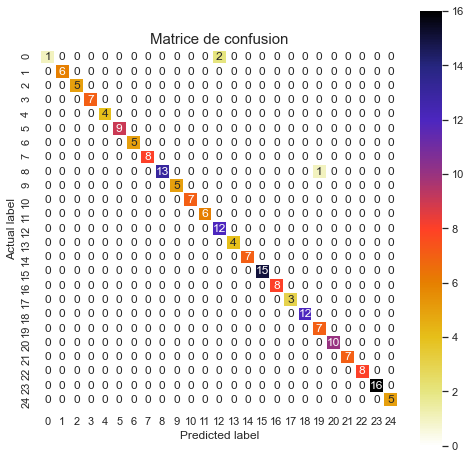

In [279]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8,8))
sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='CMRmap_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title("Matrice de confusion", size = 15)
plt.show()

In [219]:
print("L'accuracy est de:", accuracy_score(y_test, y_pred))

L'accuracy est de: 0.9844559585492227
